In [ ]:
import sys
import os
if 'google.colab' in sys.modules:
    src_path = '/content/Multimodal-Vehicle-Damage-Assessor/src'
    os.chdir('/content/Multimodal-Vehicle-Damage-Assessor')
    sys.path.insert(0, src_path)
else:
  sys.path.append(os.path.join(os.path.dirname(__file__), '..', 'src'))

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import config
from data_loader import create_data_generators, get_dataset_info, plot_sample_images
from tensorflow.keras.preprocessing.image import ImageDataGenerator


Found 1383 images belonging to 3 classes.
Found 248 images belonging to 3 classes.
Found 248 images belonging to 3 classes.


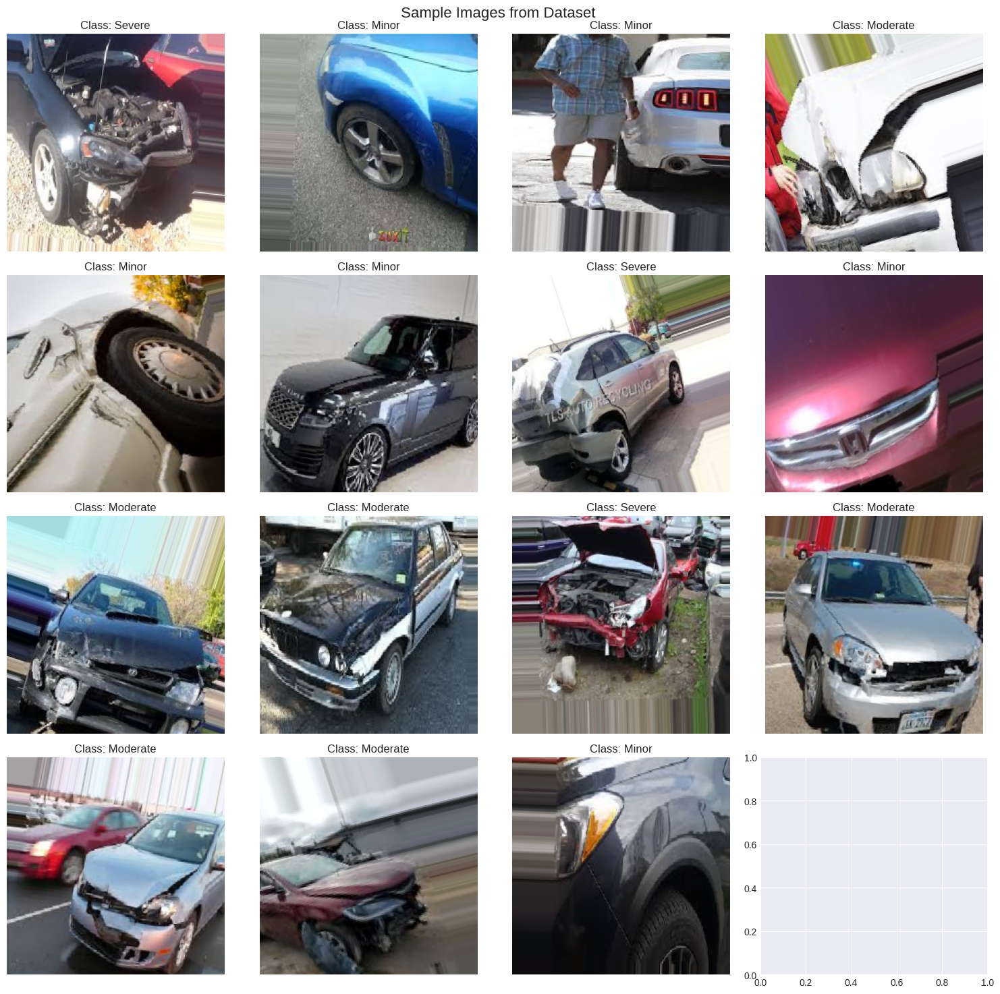

Found 1383 images belonging to 3 classes.


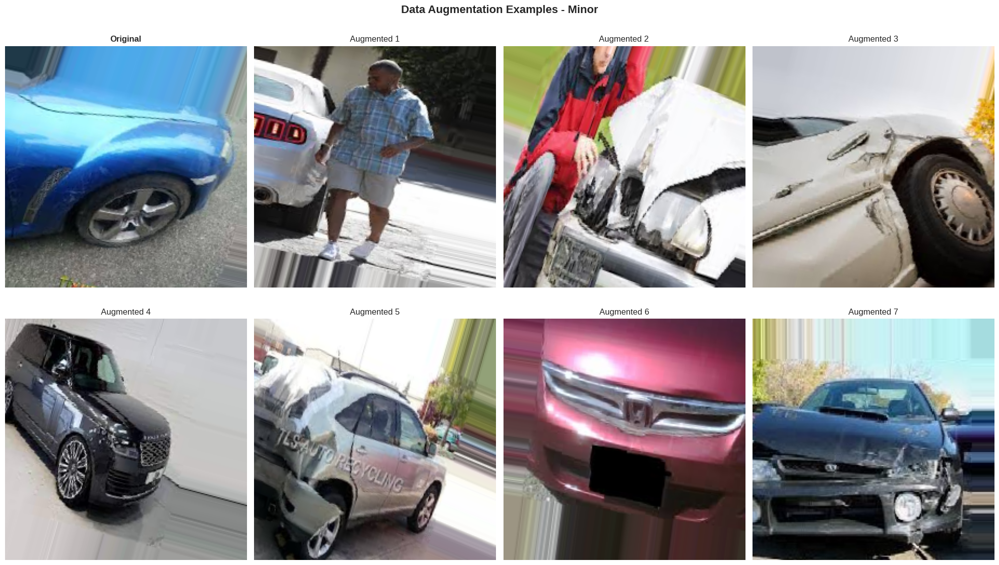

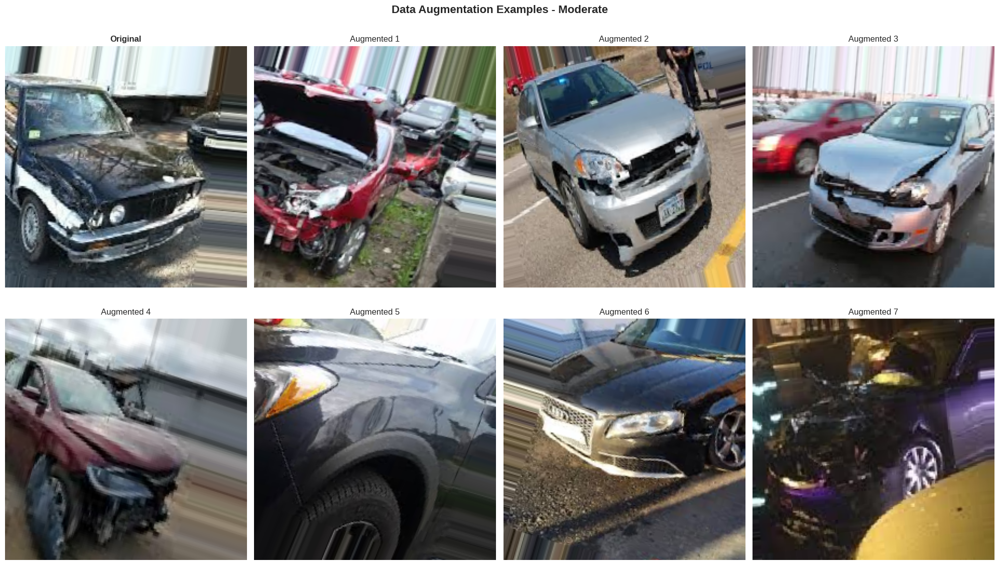

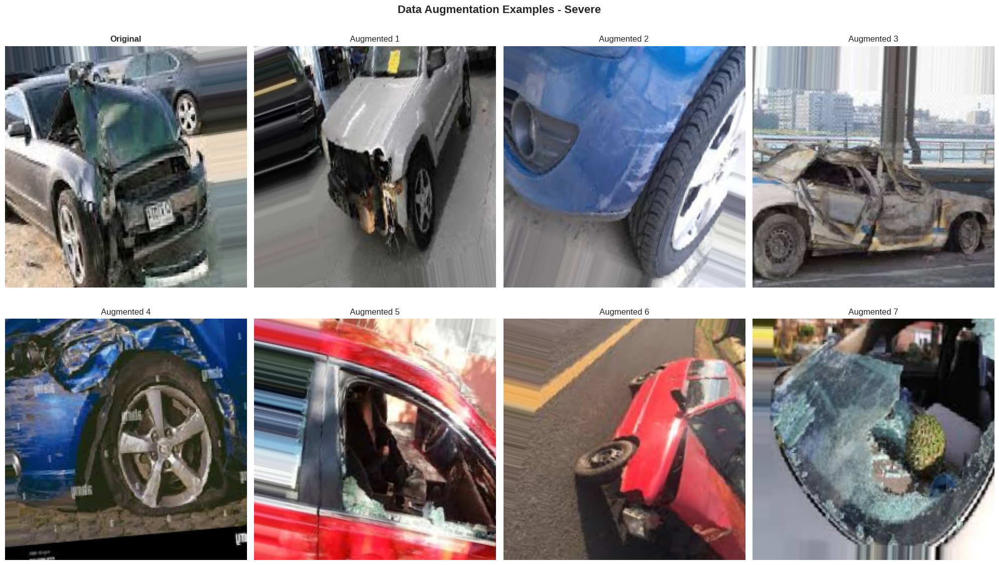

In [42]:
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

train_gen, val_gen = create_data_generators()
info = get_dataset_info(train_gen, val_gen)

fig = plot_sample_images(train_gen, num_images=15)
plt.savefig(os.path.join(config.BASE_DIR, 'results', 'sample_images.png'), dpi=300, bbox_inches='tight')
plt.show()

aug_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=config.ROTATION_RANGE,
    width_shift_range=config.WIDTH_SHIFT_RANGE,
    height_shift_range=config.HEIGHT_SHIFT_RANGE,
    shear_range=config.SHEAR_RANGE,
    zoom_range=config.ZOOM_RANGE,
    horizontal_flip=config.HORIZONTAL_FLIP,
    fill_mode=config.FILL_MODE
)

aug_gen = aug_datagen.flow_from_directory(
    config.SEVERITY_TRAIN_DIR,
    target_size=(config.IMG_HEIGHT, config.IMG_WIDTH),
    batch_size=1,
    class_mode='categorical',
    shuffle=True,
    seed=config.RANDOM_SEED
)

# Show augmentation for each class
for class_name in config.SEVERITY_CLASS_NAMES:    
    # Get an image from this class
    found = False
    while not found:
        images, labels = next(aug_gen)
        class_idx = np.argmax(labels[0])
        if config.SEVERITY_CLASS_NAMES[class_idx].lower() == class_name.lower():
            found = True
    
    # Generate multiple augmented versions
    fig, axes = plt.subplots(2, 4, figsize=(20, 12))
    fig.suptitle(f'Data Augmentation Examples - {class_name}', fontsize=16, fontweight='bold')
    
    for i in range(8):
        row = i // 4
        col = i % 4
        
        if i == 0:
            # Show original
            axes[row, col].imshow(images[0])
            axes[row, col].set_title('Original', fontsize=12, fontweight='bold')
        else:
            # Show augmented
            aug_images, _ = next(aug_gen)
            axes[row, col].imshow(aug_images[0])
            axes[row, col].set_title(f'Augmented {i}', fontsize=12)
        
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.savefig(os.path.join(config.BASE_DIR, 'results', f'augmentation_{class_name.lower()}.png'), 
                dpi=300, bbox_inches='tight')
    plt.show()